# Intro

The Audio Classification for Smart Home Audio Systems project will use data from the Freesound Dataset Kaggle 2018 dataset as explained in /FSDKaggle2018.doc/README.md. In brief, this dataset contains 11,073 audio files annotated with 41 labels, one label per audio file. The goal is to build a model that can categorize an audio clip as belonging to one of the 41 label categories. 

The audio files in the dataset are all uncompressed PCM 16-bit, 44.1 kHz, mono audio files (.WAV format). The files have also been pre-split into a train and test set, each in their own folder on the file system. These folders have not been uploaded to this GitHub repository due to their file size. According to the authors of the dataset, the training set contains ~9.5k samples unequally distributed between the categories, whereas the test set contains the remaining ~1.6k samples. Within the training set, the minimum number of audio samples per category is 94, and the maximum is 300. The duration of the audio samples range from 30 ms to 30 s. Furthermore, of the files in the training set, only ~3.7k have verified labels while the remaining ~5.8k have non-verified labels, and each group is labeled as such. However, the non-verified labels are estimated to be correct on 65-70% of the files for each category. To label the audio files, a .CSV files has been provided linking the audio file name to a label, as well as a verification label, audio source ID, and audio license.

For methodology, this project leans heavily on guidance from TensorFlow's [Simple audio recognition: Recognizing keywords](https://www.tensorflow.org/tutorials/audio/simple_audio) tutorial. This reference point was chosen because its use of spectrograms and convolutional neural networks (CNNs) builds upon concepts learned in Springboard's Time Series Analysis in Python 21.1.4 unit and 22.2 Image Processing unit. However, a further reference point that also employs TensorFlow has been provided by the authors of the dataset at [this address](https://github.com/DCASE-REPO/dcase2018_baseline/tree/master/task2).

# This Notebook

This notebook contains the Data Wrangling and Exploratory Data Analysis (EDA) phases of the Data Science Method. However, there are two sources of data for this dataset:
1) Metadata in the form of a .CSV files containing file names, labels, audio source, etc.
2) Audio data in the form of .WAV files contained in sub folders Train and Test within the working directory

This notebook is split along this division, meaning that Data Wrangling and EDA are applied in turn to the metadata, then the audio data.

# Setup

In [1]:
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from IPython import display

# Data Wrangling Part One: Metadata

The first step is to ingest the dataset into the environment and confirm that it looks as expected.

In [2]:
# open the metadata file that contains the labels for the WAV files
path_to_train_metadata = 'FSDKaggle2018.meta/train_post_competition.csv'
train_metadata = pd.read_csv(path_to_train_metadata)
train_metadata.head()

,fname,label,manually_verified,freesound_id,license
0,00044347.wav,Hi-hat,0,28739,Attribution
1,001ca53d.wav,Saxophone,1,358827,Attribution
2,002d256b.wav,Trumpet,0,10897,Creative Commons 0
3,0033e230.wav,Glockenspiel,1,325017,Attribution
4,00353774.wav,Cello,1,195688,Attribution


In [3]:
train_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9473 entries, 0 to 9472
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   fname              9473 non-null   object
 1   label              9473 non-null   object
 2   manually_verified  9473 non-null   int64 
 3   freesound_id       9473 non-null   int64 
 4   license            9473 non-null   object
dtypes: int64(2), object(3)
memory usage: 370.2+ KB


In [4]:
train_metadata.label.nunique()

41

In [5]:
path_to_train_files = 'FSDKaggle2018.audio_train.nosync'
train_files = os.listdir(path=path_to_train_files)
len(train_files)

9473

In [6]:
train_metadata_sorted = train_metadata.sort_values('fname')
train_files_sorted = sorted(train_files)
print(sum(train_metadata_sorted.fname == train_files_sorted))

9473


The dataset is very clean. The .CSV file of training metadata looks as expected, there are no missing values, and there are 9,473 audio files represented, which is true to the stated ~9.5k. The 41 unique category labels are present as well. Lastly, each file name in the metadata corresponds to a real audio file in the directory.

In [7]:
path_to_test_metadata = 'FSDKaggle2018.meta/test_post_competition_scoring_clips.csv'
test_metadata = pd.read_csv(path_to_test_metadata)
test_metadata.head()

,fname,label,usage,freesound_id,license
0,00326aa9.wav,Oboe,Private,355125,Attribution
1,0038a046.wav,Bass_drum,Private,90621,Creative Commons 0
2,007759c4.wav,Saxophone,Private,13406,Creative Commons 0
3,008afd93.wav,Saxophone,Private,358962,Attribution
4,00ae03f6.wav,Chime,Private,78203,Attribution


In [8]:
test_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   fname         1600 non-null   object
 1   label         1600 non-null   object
 2   usage         1600 non-null   object
 3   freesound_id  1600 non-null   int64 
 4   license       1600 non-null   object
dtypes: int64(1), object(4)
memory usage: 62.6+ KB


In [9]:
test_metadata.label.nunique()

41

In [10]:
path_to_test_files = 'FSDKaggle2018.audio_test.nosync'
test_files = os.listdir(path=path_to_test_files)
len(test_files)

1600

In [11]:
test_metadata_sorted = test_metadata.sort_values('fname')
test_files_sorted = sorted(test_files)
print(sum(test_metadata_sorted.fname == test_files_sorted))

1600


The testing data is similarly clean, and is confirmed to feature each of the 41 category labels.

In [12]:
all_files = pd.Series(train_files + test_files)
file_count = len(all_files)
file_name_unique = all_files.nunique()
print(f'Total number of files: {file_count}')
print(f'Total number of unique file names: {file_name_unique}')
assert file_count == file_name_unique

Total number of files: 11073
Total number of unique file names: 11073


Finally, a list of all the labels will be useful for constructing the spectrogram dataset much further down during pre-processing. The list will be used to grab string representations of the binary string values in the label tensor that's required as a part of the `tensorflow.data.Dataset` constructor's graph mode. In a way, this list acts as the encoding scheme for the labels, as the preprocessing pipeline will attribute the label index to the audio data rather than the label itself as a string. The list can be created now.

In [13]:
all_labels = test_metadata.label.unique()
all_labels

array(['Oboe', 'Bass_drum', 'Saxophone', 'Chime', 'Electric_piano',
       'Shatter', 'Bark', 'Acoustic_guitar', 'Scissors', 'Double_bass',
       'Knock', 'Telephone', 'Violin_or_fiddle', 'Gunshot_or_gunfire',
       'Burping_or_eructation', 'Clarinet', 'Computer_keyboard', 'Flute',
       'Cello', 'Tambourine', 'Drawer_open_or_close', 'Snare_drum',
       'Fart', 'Meow', 'Trumpet', 'Fireworks', 'Bus', 'Keys_jangling',
       'Applause', 'Harmonica', 'Cough', 'Gong', 'Glockenspiel',
       'Tearing', 'Writing', 'Squeak', 'Microwave_oven', 'Laughter',
       'Finger_snapping', 'Hi-hat', 'Cowbell'], dtype=object)

# Exploratory Data Analysis Part One: Metadata

With confirmation that the metadata is clean and all audio files represented in the metadata are present, the metadata itself can be explored to get a better idea of the dataset.

In [14]:
label_counts_df = pd.DataFrame(train_metadata.label.value_counts()).rename(columns={'label':'label_count_train'}).join(
                  pd.DataFrame(test_metadata.label.value_counts()).rename(columns={'label':'label_count_test'}))

In [15]:
label_counts_df

,label_count_train,label_count_test
Hi-hat,300,39
Laughter,300,38
Shatter,300,29
Applause,300,32
Squeak,300,29
Acoustic_guitar,300,45
Bass_drum,300,28
Saxophone,300,110
Flute,300,55
Double_bass,300,40


In [16]:
print(label_counts_df.label_count_train.sum())
print(label_counts_df.label_count_test.sum())

9473
1600


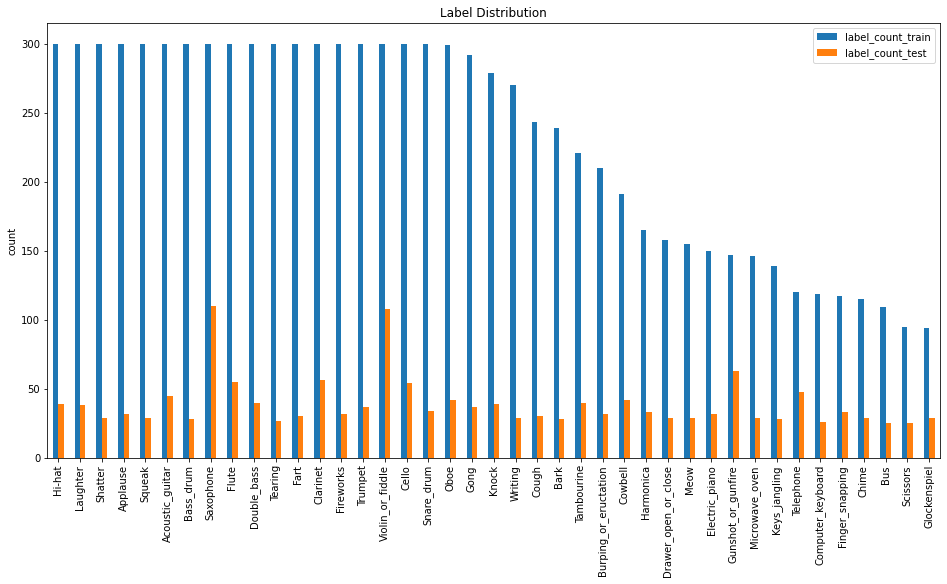

In [17]:
_ = label_counts_df.plot(kind='bar', figsize=(16,8))
plt.ylabel('count')
plt.title('Label Distribution')
plt.savefig('img/label_distribution.png')
plt.show()

In [18]:
print(str(round(train_metadata.manually_verified.mean() * 100, 2)) + '%')

39.16%


In [19]:
verified_train_df = pd.DataFrame(train_metadata.label.value_counts()).rename(columns={'label':'label_count_train'}).join(
    pd.DataFrame(train_metadata.groupby('label').sum().manually_verified))

In [20]:
verified_train_df

,label_count_train,manually_verified
Hi-hat,300,89
Laughter,300,88
Shatter,300,67
Applause,300,61
Squeak,300,69
Acoustic_guitar,300,105
Bass_drum,300,67
Saxophone,300,256
Flute,300,128
Double_bass,300,92


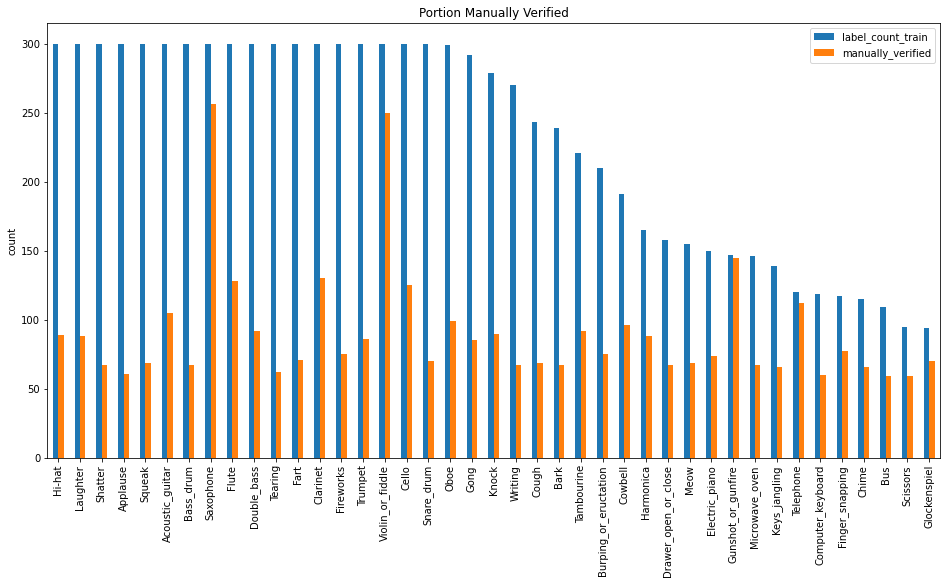

In [21]:
_ = verified_train_df.plot(kind='bar', figsize=(16,8))
plt.ylabel('count')
plt.title('Portion Manually Verified')
plt.savefig('img/portion_manually_verified.png')
plt.show()

Each label has good representation of manually verified samples. For now, all the existing labels will be taken as truth.

# Data Wrangling Part Two: Audio Data

Of the 41 labels, within the training set the maximum sample count per label was 300, and the minimum was 94 (Fig. 2)The metadata is one thing, but the binary .WAV files are not useful yet. They need to be read into Python so that operations can be performed on the information contained within. Specifically, the .WAV audio files contain values that represent the amplitude of the audio signal at discreet points in time as defined by the sampling rate. As mentioned before, these files are 16-bit with a 44.1 kHz sampling rate, meaning that for each second of data in the audio file there are 44,100 values between -32,768 and 32,767. Additionally, each audio file may contain more than one channel of information, thus adding to the size; however, the files in this dataset are stated to be mono, meaning they only contain one channel.

The process is to read in this one channel of information as a list of amplitudes, specifically by using TensorFlow to represent the list as a Tensor object of values scaled between -1.0 and 1.0 using `tensorflow.audio.decode_wav()`. TensorFlow offers a rich API for machine learning, and at this point makes sense to be the dominant ecosystem for further analysis of the audio data in this project. As such, further data wrangling will prepare the data for TensorFlow.

First up: checking out `.decode_wav()` which requires a file object as input. The file object can be obtained by passing the file path to `tensorflow.io.read_file()` and below is tested using the first file in the training metadata. The function `.decode_wav()` returns a tuple where the first element is the audio data (with a column per channel) and the second element is the sampling rate.

In [22]:
test_file = tf.io.read_file('FSDKaggle2018.audio_train.nosync/00044347.wav')
test_audio, test_sampling_rate = tf.audio.decode_wav(contents=test_file)
test_audio.shape

Metal device set to: Apple M1 Max


2022-03-12 12:59:02.500661: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-03-12 12:59:02.500782: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


TensorShape([617400, 1])

Excellent, the one dimensional shape confirms this is a mono file.

In [23]:
test_sampling_rate

<tf.Tensor: shape=(), dtype=int32, numpy=44100>

And indeed, the sampling rate is 44.1 kHz.

Now, a function can be defined that will get the audio data for each file path, ignoring the sampling rate and non-present channels.

In [24]:
def decode_audio(audio_binary):
    audio, _ = tf.audio.decode_wav(contents=audio_binary)
    return tf.squeeze(audio, axis=-1)

For example:

In [25]:
decode_audio(test_file)

<tf.Tensor: shape=(617400,), dtype=float32, numpy=
array([ 0.0000000e+00,  7.9345703e-04, -1.5258789e-04, ...,
        3.0517578e-05,  0.0000000e+00,  0.0000000e+00], dtype=float32)>

The test file now appears as a list of amplitudes. Now that the .WAV files can be read into Python as tensors, the next step is to make use of the `tensorflow.data.Dataset` API so that the full dataset does not need to be loaded into memory. The goal will be to get a Dataset object from which the audio and the label can be called and this will need a pipeline to construct. A function needs to be written to combine the label with the decoded waveform and then mapped to the training files (and then later the test files).

In [26]:
def get_waveform_and_label(labeled_file):
    
    audio_binary = tf.io.read_file(path_to_train_files + '/' + labeled_file[0])
    
    waveform = decode_audio(audio_binary)
    return waveform, labeled_file[1]

In [27]:
training_files_with_labels = list(zip(train_metadata.fname, train_metadata.label))
testing_files_with_labels = list(zip(test_metadata.fname, test_metadata.label))

In [28]:
AUTOTUNE = tf.data.AUTOTUNE

labeled_training_files_ds = tf.data.Dataset.from_tensor_slices(training_files_with_labels)

training_waveform_ds = labeled_training_files_ds.map(map_func=get_waveform_and_label, num_parallel_calls=AUTOTUNE)

A few of the audio files can be visualized to confirm the waveforms are now attributed to the labels.

2022-03-12 12:59:02.683360: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


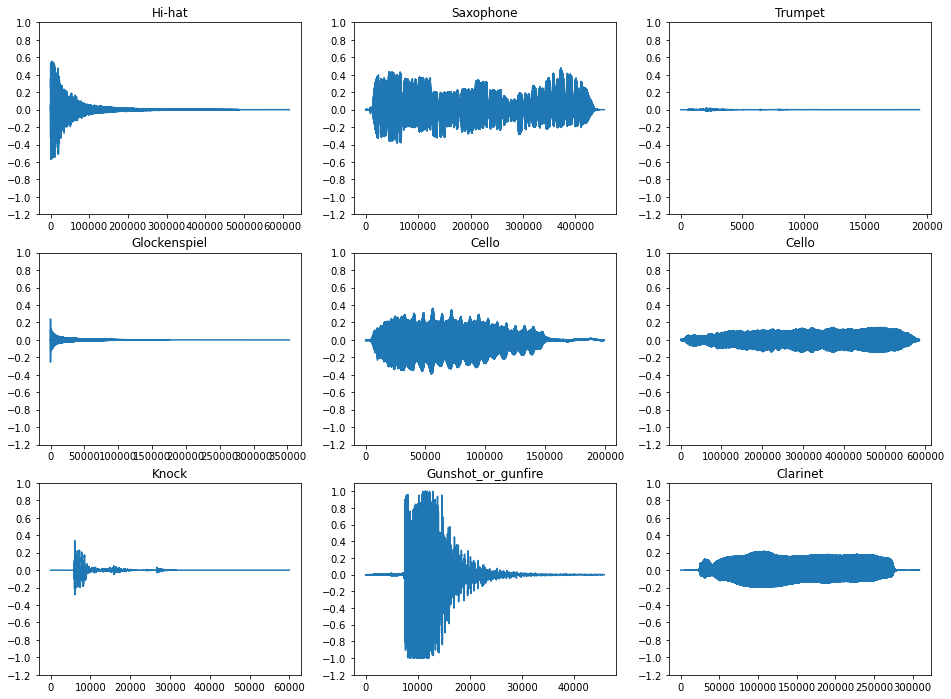

In [29]:
rows = 3
cols = 3
n = rows * cols
fig, axes = plt.subplots(rows, cols, figsize=(16,12))

for i, (audio, label) in enumerate(training_waveform_ds.take(n)):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    ax.plot(audio.numpy())
    ax.set_yticks(np.arange(-1.2, 1.2, 0.2))
    label = label.numpy().decode('utf-8')
    ax.set_title(label)

plt.savefig('img/example_waveforms.png')
plt.show()

Going forward from here, the audio files need to have the same length to create spectrograms of the same dimensions to be fed into the CNN. This can be done by choosing a length of time for all the samples, and either truncating the audio file after the length cutoff, or zero padding the end of the file to fill the space until the cutoff. However, choosing this length of time is a challenge for this dataset because the length of the audio files ranges from 300 ms to 30 s. Choosing too short of a length will eliminate valuable data from the longer samples, but too long of a length may compress short sounds so much as to not be noticable after convolution of the spectrogram. While this choice will likely be something that gets dialed in as a part of iterative feature engineering for this particular pipeline, there also seems to be a lot to explore with TensorFlow's `tensorflow.signal.frame` function to create multiples of examples of evenly sized but smaller spectrograms for long files. For now, something reasonable will be chosen and a more intelligent system explored in future iterations of this work. To choose a reasonable value, a histogram of the file lengths can be used.

In [30]:
lengths = [len(audio)/(44.1*1000) for audio, label in training_waveform_ds]

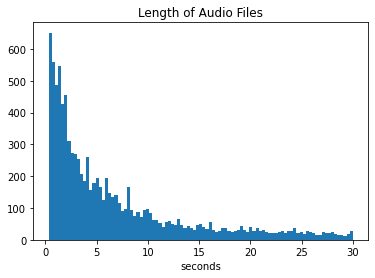

In [31]:
plt.hist(lengths, bins=int(np.sqrt(len(lengths))))
plt.xlabel('seconds')
plt.title('Length of Audio Files')
plt.savefig('img/file_length.png')
plt.show()

In [32]:
for cutoff in range(30):
    below_cutoff = sum(length <= cutoff for length in lengths)
    whole_files = round(below_cutoff/len(lengths)*100, 2)
    print(f'Percentage of whole files with cutoff of {cutoff} s: {whole_files}%')

Percentage of whole files with cutoff of 0 s: 0.0%
Percentage of whole files with cutoff of 1 s: 14.68%
Percentage of whole files with cutoff of 2 s: 31.06%
Percentage of whole files with cutoff of 3 s: 41.55%
Percentage of whole files with cutoff of 4 s: 49.65%
Percentage of whole files with cutoff of 5 s: 56.18%
Percentage of whole files with cutoff of 6 s: 61.68%
Percentage of whole files with cutoff of 7 s: 66.75%
Percentage of whole files with cutoff of 8 s: 70.7%
Percentage of whole files with cutoff of 9 s: 74.09%
Percentage of whole files with cutoff of 10 s: 76.93%
Percentage of whole files with cutoff of 11 s: 79.44%
Percentage of whole files with cutoff of 12 s: 81.23%
Percentage of whole files with cutoff of 13 s: 83.08%
Percentage of whole files with cutoff of 14 s: 84.6%
Percentage of whole files with cutoff of 15 s: 86.03%
Percentage of whole files with cutoff of 16 s: 87.53%
Percentage of whole files with cutoff of 17 s: 88.65%
Percentage of whole files with cutoff of 1

A cutoff of 4 s seems to be a reasonable selection. Half of the files exist in their entirety (albeit with some amount of zero-padding), and half of the files fill the spectrograph frame, but are truncated. Additionally, with a look to the waveforms above, there seems to be a suggestion that most sounds contain meaningful data below 4 s and may only contain only more of the same data after 4 s. The largest risk with the approach is that short files may overfit on the zero-padding and not on the actual audio content, so close attention will need to be paid to labels like "Gunshot_or_gunfire".

In [33]:
cutoff_in_seconds = 4

Next, a function must be defined to get a spectrogram for an audio waveform by using a Short-Time Fourier Transform on the waveform.

In [34]:
def get_spectrogram(waveform):
    
    # crop waveforms to below cutoff, and add zero-padding to anything shorter
    input_len = int(44.1*1000*cutoff_in_seconds)
    waveform = waveform[:input_len]
    zero_padding = tf.zeros([input_len] - tf.shape(waveform), dtype=tf.float32)
    waveform = tf.cast(waveform, dtype=tf.float32)
    equal_length = tf.concat([waveform, zero_padding], 0)
    
    # get spectrogram: frame_length and frame_step chosen to produce a "square image", see spectrogram shape below
    spectrogram = tf.signal.stft(equal_length, frame_length=555, frame_step=343)
    
    # get the magnitude only of the spectrogram
    spectrogram = tf.abs(spectrogram)
    
    # add a "channels" axis so that the spectrogram can be treated like an image which the CNN expects
    spectrogram = spectrogram[..., tf.newaxis]
    
    return spectrogram

The first audio file in the training waveform dataset can be investigated.

In [35]:
for waveform, label in training_waveform_ds.take(1):
    label = label.numpy().decode('utf-8')
    spectrogram = get_spectrogram(waveform)
    
print('Label:', label)
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
display.display(display.Audio(waveform, rate=44100))

Label: Hi-hat
Waveform shape: (617400,)
Spectrogram shape: (513, 513, 1)
Audio playback


The spectrogram can be plotted with the help of a function.

In [36]:
def plot_spectrogram(spectrogram, ax):
    
    # removes "channels" axis for plotting
    if len(spectrogram.shape) > 2:
        assert len(spectrogram.shape) == 3
        spectrogram = np.squeeze(spectrogram, axis=-1)
    
    # transpose the spectrogram to have time on the x-axis, and add smallest representable number to avoid log of time zero
    # convert frequencies to log scale: mimics how sound is perceived
    log_spec = np.log(spectrogram.T + np.finfo(float).eps)
    
    height = log_spec.shape[0]
    width = log_spec.shape[1]
    X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
    Y = range(height)
    ax.pcolormesh(X, Y, log_spec)

Now, the spectrogram for the first audio file can be visualized.

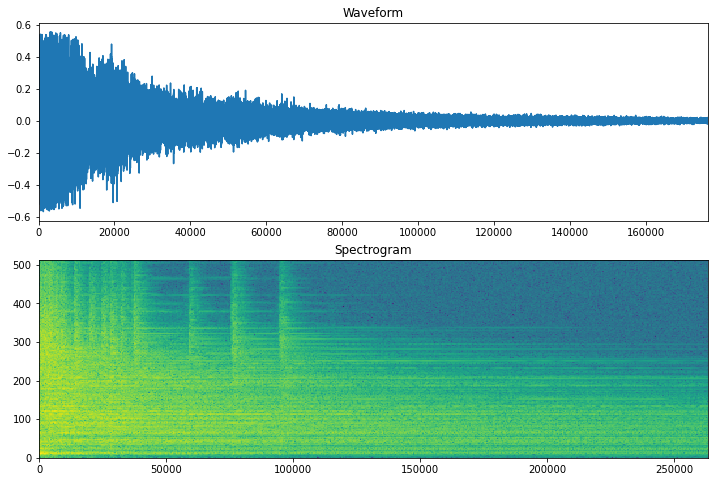

In [37]:
fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, int(44.1*1000*cutoff_in_seconds)])

plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

Create a mapping function to produce specrograms for the audio files with the label indices, and create a training spectrogram dataset.

In [38]:
def get_spectrogram_and_label_id(audio, label):
    spectrogram = get_spectrogram(audio)
    label_id = tf.argmax(label == all_labels)
    return spectrogram, label_id

In [39]:
training_spectrogram_ds = training_waveform_ds.map(map_func=get_spectrogram_and_label_id, num_parallel_calls=AUTOTUNE)

Now the first few audio files can be examined.

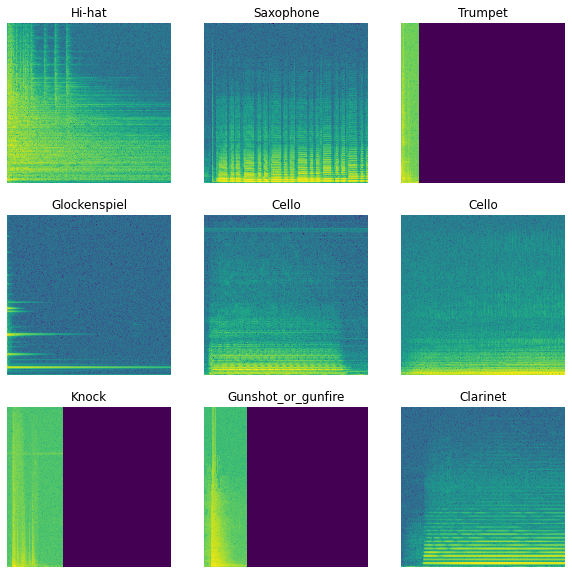

In [40]:
rows = 3
cols = 3
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

for i, (spectrogram, label_id) in enumerate(training_spectrogram_ds.take(n)):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    plot_spectrogram(spectrogram.numpy(), ax)
    ax.set_title(all_labels[label_id.numpy()])
    ax.axis('off')

plt.savefig('img/example_spectrograms.png')
plt.show()

Fantastic. The audio data has been wrangled into `training_spectrogram_ds` through the `files_with_labels` > `Dataset` > `map(get_waveform_and_label)` > `map(get_spectrogram_and_label_id)` pipeline, and reresents a spectrogram for each file with the corresponding label. This data will be fed into the CNN.

As mentioned before, the zero padding is very obvious in the spectrograms, and will be a key area for improvement in the future.

# Exploratory Data Analysis Part Two: Audio Data

With the audio spectrograms labeled, the spectrograms for each label can be visualized to see if they look different between classes, and then likewise if they appear similar within a class. Above is evidence that the spectrograms are different between different labels: saxophone has many vertical columns, clarinet has many horizontal rows, hi-hat is a jagged grid, etc. Below, similarity is explored. First, two functions are defined to filter the Datasets.

In [41]:
def filter_waveform_fn(waveform, label):
    return label == rand_label

In [42]:
def filter_spectrogram_fn(spectrogram, label_id):
    return label_id == list(all_labels).index(rand_label)

Below chooses a random label and plots its first 9 spectrograms, first 9 audio files, and displays the rows of the metadata corresponding to that label. This code cell can be run multiple times to examine a few different labels.

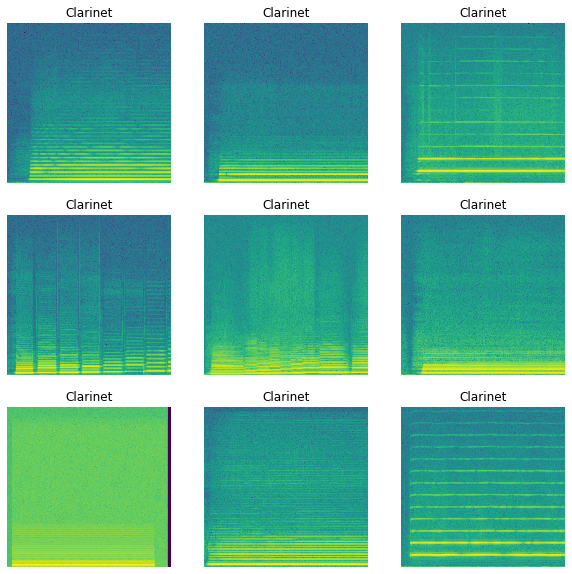

Label: Clarinet
Waveform shape: (308700,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (242550,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (226674,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (393372,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (273420,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (311346,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (171990,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (436590,)
Spectrogram shape: (513, 513, 1)
Audio playback


Label: Clarinet
Waveform shape: (242550,)
Spectrogram shape: (513, 513, 1)
Audio playback


,fname,label,manually_verified,freesound_id,license
8,004ad66f.wav,Clarinet,0,248370,Attribution
38,013c3135.wav,Clarinet,0,248414,Attribution
40,015cf474.wav,Clarinet,0,249143,Attribution
92,027aa77c.wav,Clarinet,1,357015,Attribution
103,02d367e4.wav,Clarinet,1,357166,Attribution
...,...,...,...,...,...
9081,f567398e.wav,Clarinet,1,356858,Attribution
9137,f6c24a56.wav,Clarinet,1,249110,Attribution
9183,f82caa0e.wav,Clarinet,1,356623,Attribution
9397,fe0cb23e.wav,Clarinet,0,356936,Attribution


In [43]:
rand_label = random.choice(train_metadata.label)

rand_label_waveform_ds = training_waveform_ds.filter(filter_waveform_fn)
rand_label_spectrogram_ds = training_spectrogram_ds.filter(filter_spectrogram_fn)

rows = 3
cols = 3
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

for i, (spectrogram, label_id) in enumerate(rand_label_spectrogram_ds.take(n)):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    plot_spectrogram(spectrogram.numpy(), ax)
    ax.set_title(all_labels[label_id.numpy()])
    ax.axis('off')
    
plt.savefig('img/in_label_spectrograms.png')
plt.show()

for n in range(9):
    for waveform, label in rand_label_waveform_ds.take(n+1):
        label = label.numpy().decode('utf-8')
        spectrogram = get_spectrogram(waveform)

    print('Label:', label)
    print('Waveform shape:', waveform.shape)
    print('Spectrogram shape:', spectrogram.shape)
    print('Audio playback')
    display.display(display.Audio(waveform, rate=44100))
    
indices_by_label = train_metadata[train_metadata.label == rand_label].index
train_metadata.iloc[indices_by_label]

Cool! Files within several of the labels do appear to have visual similarities that a CNN could pick out. Violin_or_fiddle samples have many wavy rows with distinctive vertical breaks. Clarinet also features vertical rows, so a comparison between these two labels in the final confusion matrix might be interesting.

# Conclusion

Alright! The data has been cleaned and is ready for modeling. In summary, there are no missing values and no duplicate values. There's a good distribution of all labels. Each audio file has a corresponding spectrogram with a label ID. The data is ready for modeling.